### author by yangshichen
### 注意：脚本仅供参考，使用前请仔细阅读

### 调用GPU

In [1]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
import scanpy as sc
import anndata as ad
import numpy as np
import pandas as pd
import seaborn as sb
from matplotlib.pyplot import rc_context
import matplotlib.pyplot as plt
import rapids_singlecell as rsc
from scipy.io import mmread
from scipy.sparse import csr_matrix
import cupy as cp
import matplotlib as mpl
mpl.rcParams['pdf.fonttype'] = 42
import scrublet as scr

import warnings
warnings.filterwarnings("ignore")

In [2]:
import rmm
rmm.reinitialize(managed_memory=True)
#cp.cuda.set_allocator(rmm.rmm_cupy_allocator)

In [3]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=100, frameon=False)
sc._settings.ScanpyConfig.n_jobs=70

scanpy==1.9.6 anndata==0.10.3 umap==0.5.5 numpy==1.24.4 scipy==1.11.4 pandas==1.5.3 scikit-learn==1.3.2 statsmodels==0.14.0 igraph==0.10.8 pynndescent==0.5.11


In [4]:
cluster_cols = ["#DC050C", "#FB8072", "#1965B0", "#7BAFDE", "#882E72", 
                "#B17BA6", "#FF7F00", "#FDB462", "#E7298A", "#E78AC3", 
                "#33A02C", "#B2DF8A", "#55A1B1", "#8DD3C7", "#A6761D", 
                "#E6AB02", "#7570B3", "#BEAED4", "#666666", "#999999", 
                "#aa8282", "#d4b7b7", "#8600bf", "#ba5ce3", "#808000", 
                "#aeae5c", "#1e90ff", "#00bfff", "#56ff0d", "#ffff00"]

### 聚类分群

In [5]:
adata = sc.read("/media/AnalysisDisk1/Yanshichen/0_HIV_RNA/HIV-pbmc2/CD8_filter.h5ad")
adata.X = adata.layers['counts'].copy()
adata

AnnData object with n_obs × n_vars = 1261644 × 21679
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'doublet', 'batch', 'sample', 'stage', 'experiments', 'age', 'total_counts_rp', 'pct_counts_rp', 'total_counts_hb', 'pct_counts_hb', 'total_counts_ncRNA', 'pct_counts_ncRNA', 'total_counts_LOC', 'pct_counts_LOC', 'total_counts_erccs', 'pct_counts_erccs', 'leiden_r2.0_n2', 'celltype_L1', 'phase_ordered', 'leiden_r5.0_n2'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection', 'mean', 'std'
    uns: 'age_colors', 'experiments_colors', 'hvg', 'leiden', 'leiden_r5.0_n2_colors', 'log1p', 'neighbors', 'pca', 'stage_colors', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [6]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata,batch_key="stage")
adata.var.highly_variable.value_counts()

normalizing counts per cell
    finished (0:02:09)
extracting highly variable genes
    finished (0:00:59)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


False    18047
True      3632
Name: highly_variable, dtype: int64

... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:09:13)


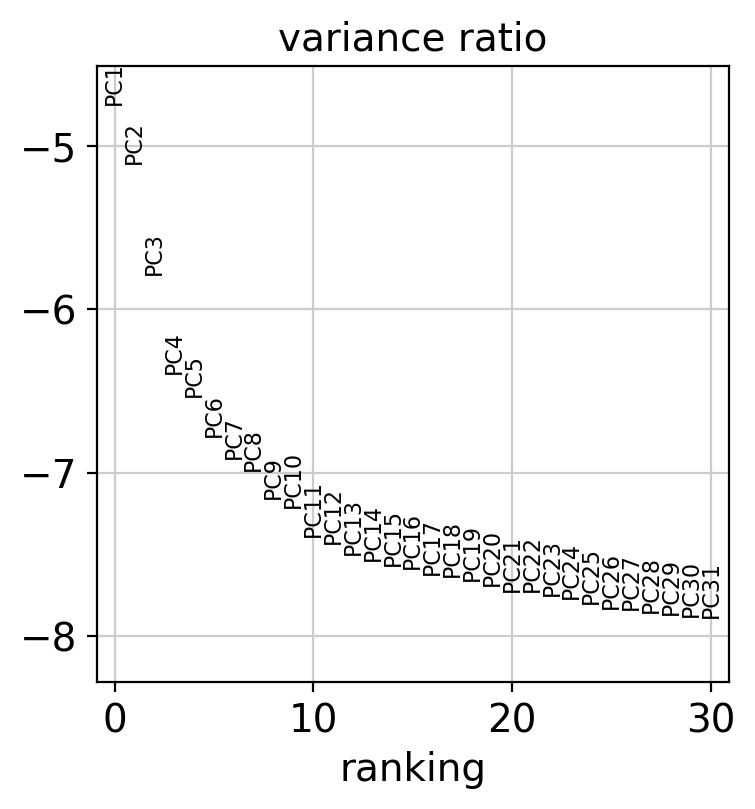

In [7]:
sc.pp.scale(adata, max_value=10)
sc.tl.pca(adata, svd_solver='arpack',n_comps=50,use_highly_variable=True)
sc.pl.pca_variance_ratio(adata,n_pcs=30,log=True)

In [8]:
rsc.pp.harmony_integrate(adata,key='experiments',max_iter_harmony = 30)

2024-05-17 16:22:23,582 - harmonypy_gpu - INFO - Iteration 1 of 30
2024-05-17 16:23:51,405 - harmonypy_gpu - INFO - Iteration 2 of 30
2024-05-17 16:25:20,602 - harmonypy_gpu - INFO - Iteration 3 of 30
2024-05-17 16:26:49,210 - harmonypy_gpu - INFO - Converged after 3 iterations


In [9]:
sc.pp.neighbors(adata, n_neighbors=30, n_pcs=12, use_rep='X_pca_harmony')
sc.tl.umap(adata,min_dist = 0.5)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:05:49)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:42:07)


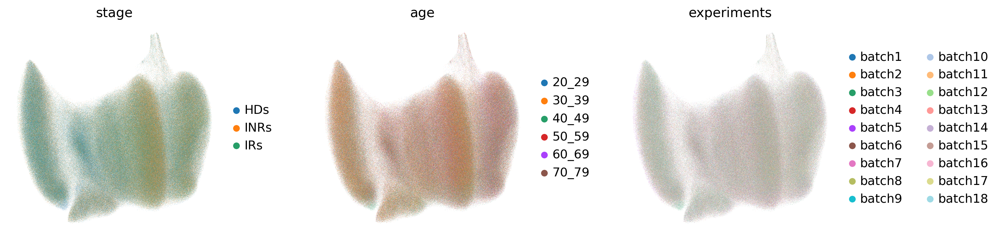

In [10]:
sc.pl.umap(adata, color=['stage', 'age', 'experiments'], wspace=0.3)

running Leiden clustering
    finished: found 30 clusters and added
    'leiden_r2.2_n2', the cluster labels (adata.obs, categorical) (0:07:39)


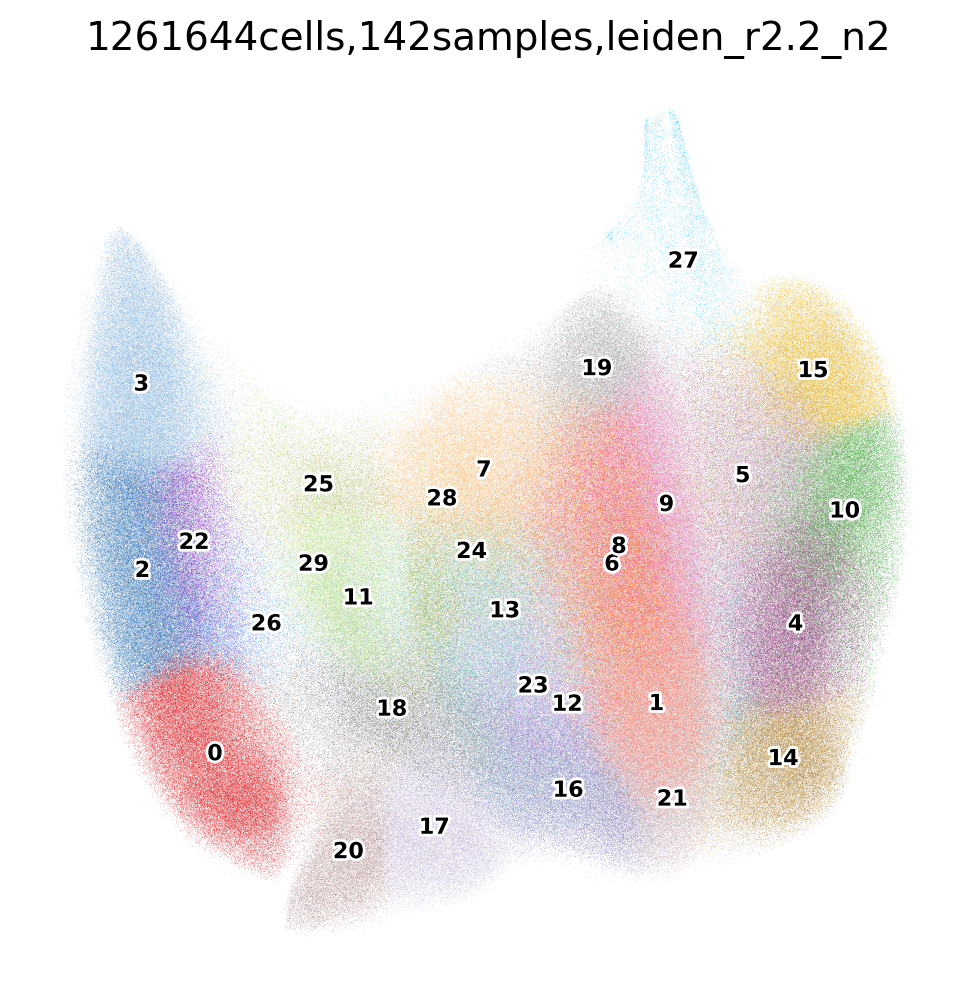

In [11]:
sc.tl.leiden(adata,resolution=2.2,n_iterations=2,key_added='leiden_r2.2_n2')
with rc_context({'figure.figsize': (6, 6)}):
    sc.pl.umap(adata,color=['leiden_r2.2_n2'],legend_fontsize=8,legend_fontoutline=2,
               palette=cluster_cols,legend_loc="on data",title='1261644cells,142samples,leiden_r2.2_n2')

running Leiden clustering
    finished: found 31 clusters and added
    'leiden_r2.5_n2', the cluster labels (adata.obs, categorical) (0:07:50)


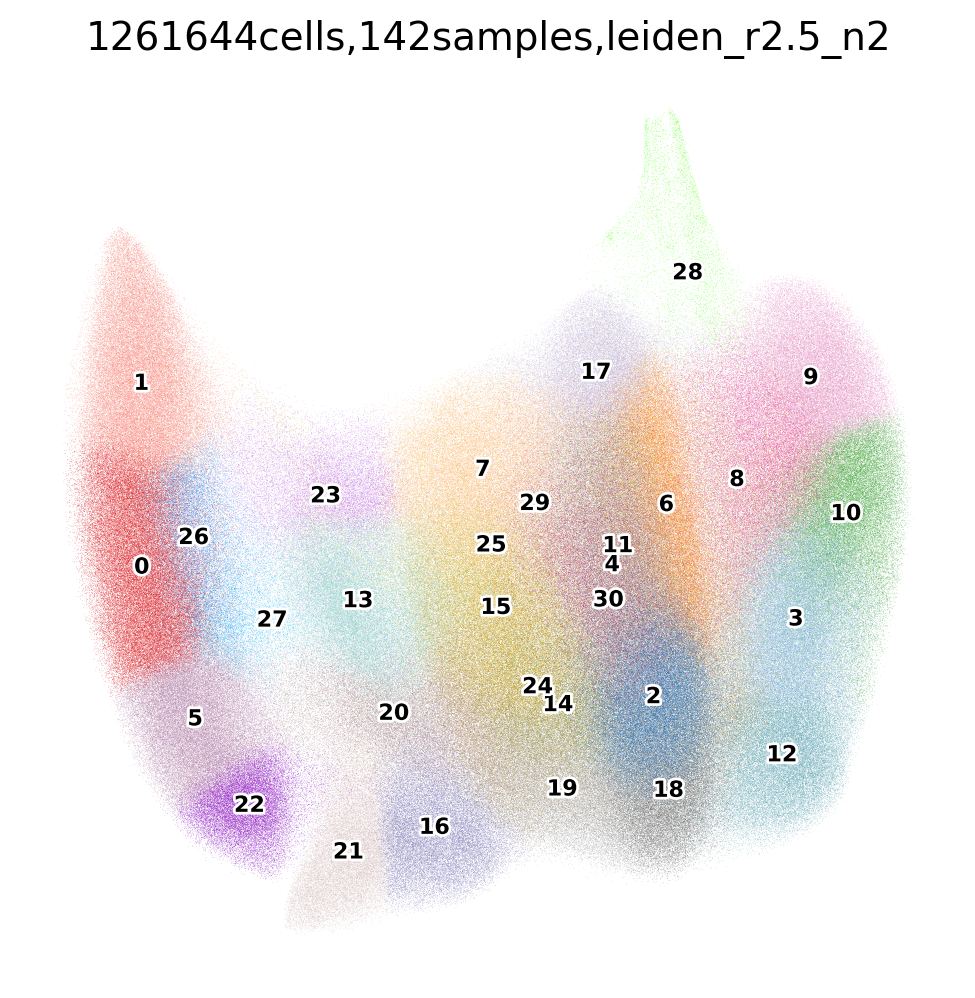

In [12]:
sc.tl.leiden(adata,resolution=2.5,n_iterations=2,key_added='leiden_r2.5_n2')
with rc_context({'figure.figsize': (6, 6)}):
    sc.pl.umap(adata,color=['leiden_r2.5_n2'],legend_fontsize=8,legend_fontoutline=2,
               palette=cluster_cols,legend_loc="on data",title='1261644cells,142samples,leiden_r2.5_n2')

### gdT亚聚类

In [44]:
adata_sub = adata[adata.obs['leiden_r2.5_n2'].isin(['8','14','25','27','29'])]
adata_hvg = adata_sub[:,adata_sub.var["highly_variable"]==True]
adata_hvg

View of AnnData object with n_obs × n_vars = 148068 × 3632
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'doublet', 'batch', 'sample', 'stage', 'experiments', 'age', 'total_counts_rp', 'pct_counts_rp', 'total_counts_hb', 'pct_counts_hb', 'total_counts_ncRNA', 'pct_counts_ncRNA', 'total_counts_LOC', 'pct_counts_LOC', 'total_counts_erccs', 'pct_counts_erccs', 'leiden_r2.0_n2', 'celltype_L1', 'phase_ordered', 'leiden_r5.0_n2', 'leiden_r2.2_n2', 'leiden_r2.5_n2'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection', 'mean', 'std'
    uns: 'age_colors', 'experiments_colors', 'hvg', 'leiden', 'leiden_r5.0_n2_colors', 'log1p', 'neighbors', 'pca', 'stage_colors', 'umap', 'leiden_r2.2_n2_colors', 'leiden_r2.5_n2_colors'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:48)


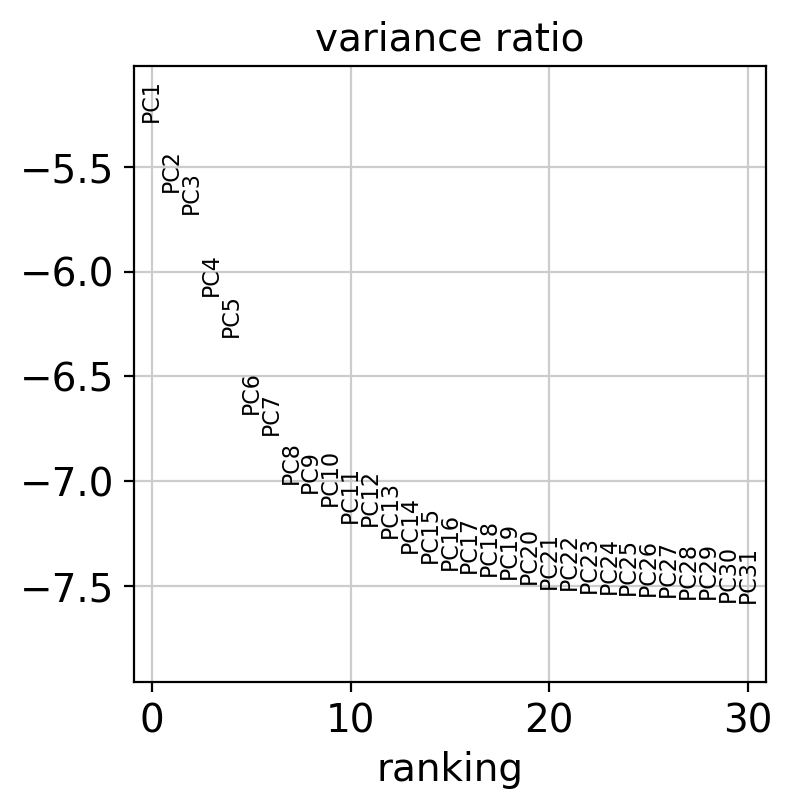

In [45]:
sc.tl.pca(adata_hvg, svd_solver='arpack',n_comps=50)
sc.pl.pca_variance_ratio(adata_hvg,n_pcs=30,log=True)

In [46]:
adata_sub.uns['pca'] = adata_hvg.uns['pca'].copy()
adata_sub.obsm['X_pca'] = adata_hvg.obsm['X_pca'].copy()

In [47]:
rsc.pp.harmony_integrate(adata_sub,key='experiments',max_iter_harmony = 30)

2024-05-19 14:47:26,666 - harmonypy_gpu - INFO - Iteration 1 of 30
2024-05-19 14:47:39,110 - harmonypy_gpu - INFO - Iteration 2 of 30
2024-05-19 14:47:51,379 - harmonypy_gpu - INFO - Iteration 3 of 30
2024-05-19 14:48:03,746 - harmonypy_gpu - INFO - Converged after 3 iterations


In [48]:
sc.pp.neighbors(adata_sub, n_neighbors=30, n_pcs=14, use_rep='X_pca_harmony')
sc.tl.umap(adata_sub,min_dist = 0.3)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:36)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:03:01)


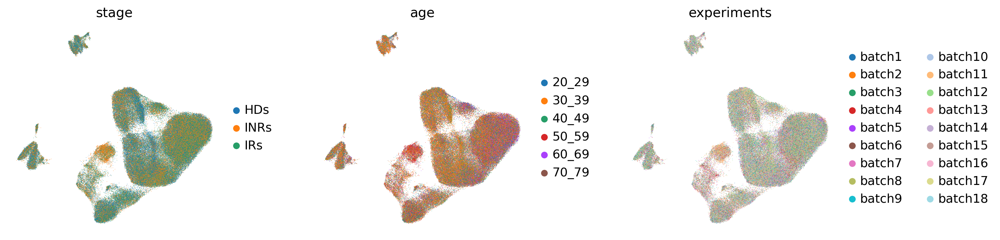

In [49]:
sc.pl.umap(adata_sub, color=['stage', 'age', 'experiments'], wspace=0.3)

running Leiden clustering
    finished: found 15 clusters and added
    'leiden_r0.8_n2', the cluster labels (adata.obs, categorical) (0:00:28)


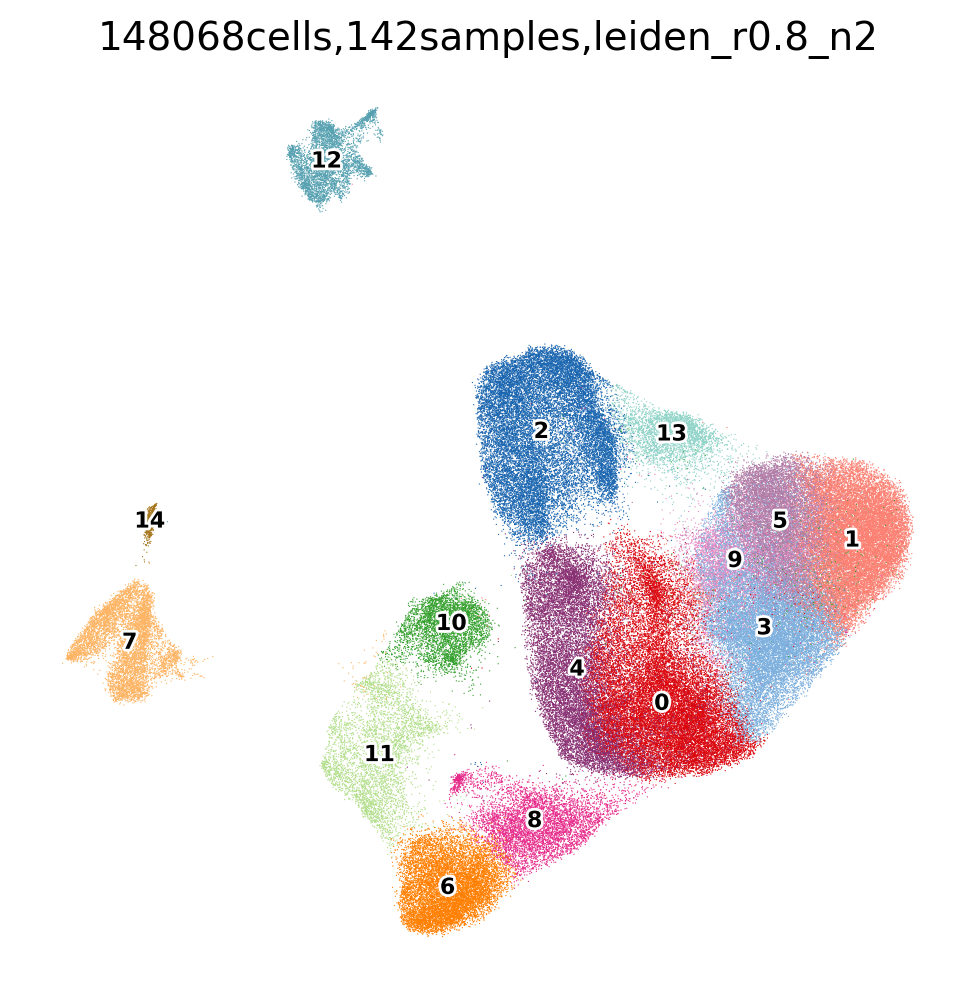

In [80]:
sc.tl.leiden(adata_sub,resolution=0.8,n_iterations=2,key_added='leiden_r0.8_n2')
with rc_context({'figure.figsize': (6, 6)}):
    sc.pl.umap(adata_sub,color=['leiden_r0.8_n2'],legend_fontsize=8,legend_fontoutline=2,
               palette=cluster_cols,legend_loc="on data",title='148068cells,142samples,leiden_r0.8_n2')

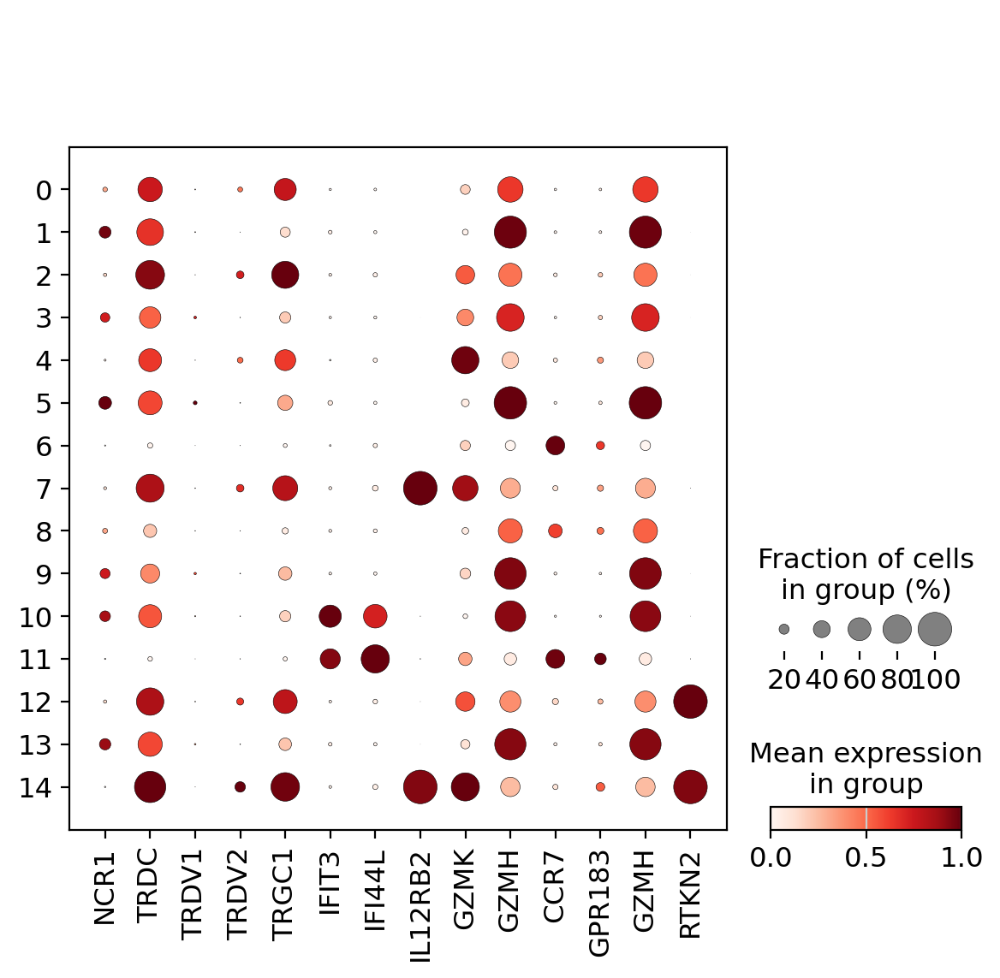

In [92]:
sc.pl.dotplot(adata_sub, ["NCR1","TRDC",'TRDV1','TRDV2',"TRGC1",'IFIT3',"IFI44L",'IL12RB2','GZMK',
                          'GZMH','CCR7','GPR183','GZMH','RTKN2'], 
              groupby='leiden_r0.8_n2',standard_scale='var')

In [93]:
new_cluster_names = ['gdT2-GZMH','NKT-NCR1','gdT2-GZMH','NKT-NCR1','gdT2-GZMK','NKT-NCR1',
                    'CD8_Tcm-GPR183','gdT2-IL12RB2','CD8_Tcm-GPR183','NKT-NCR1','NKT-IFIT3',
                    'CD8_Tcm-IFI44L','gdT2-GZMH','NKT-NCR1','gdT2-IL12RB2']
adata_sub.obs['leiden_r0.8_n2']=adata_sub.obs['leiden_r0.8_n2'].replace(
    to_replace = list(adata_sub.obs['leiden_r0.8_n2'].cat.categories.values),value = new_cluster_names)

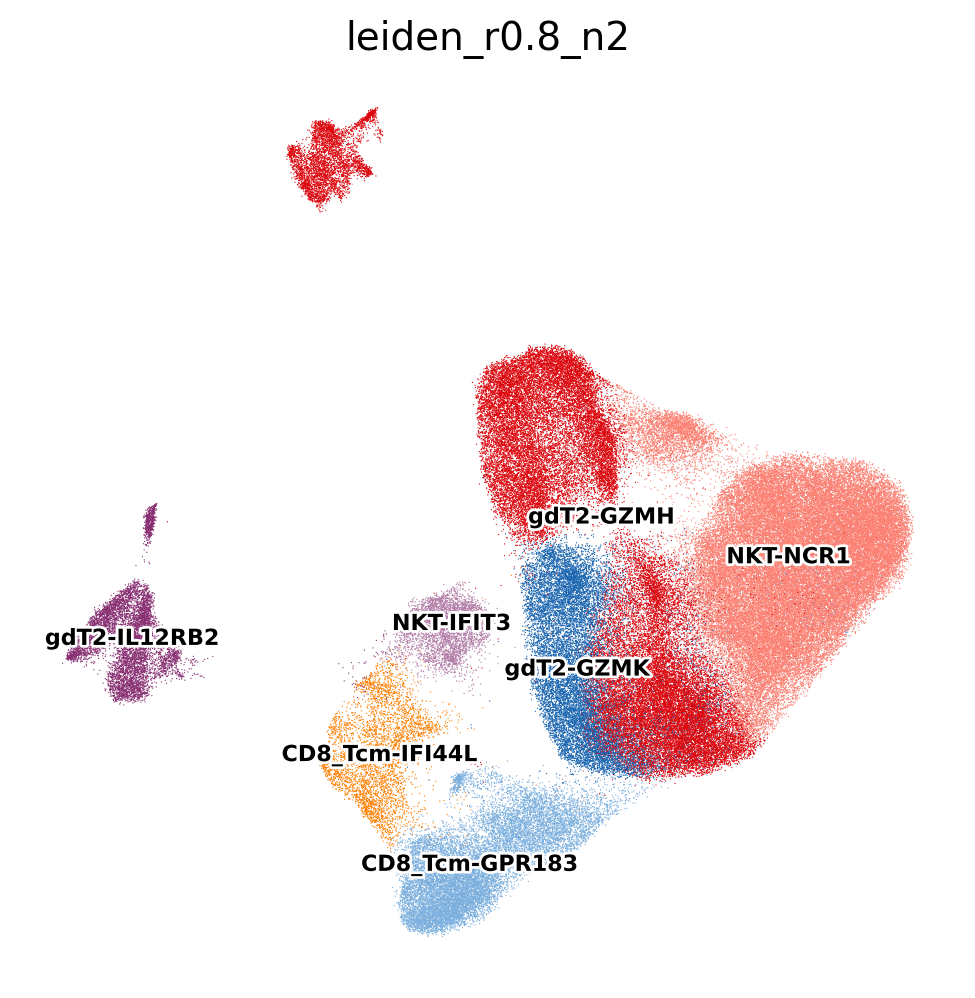

In [94]:
with rc_context({'figure.figsize': (6, 6)}):
    sc.pl.umap(adata_sub, color=['leiden_r0.8_n2'], legend_loc='on data',
               legend_fontsize=8, legend_fontoutline=2,palette=cluster_cols)

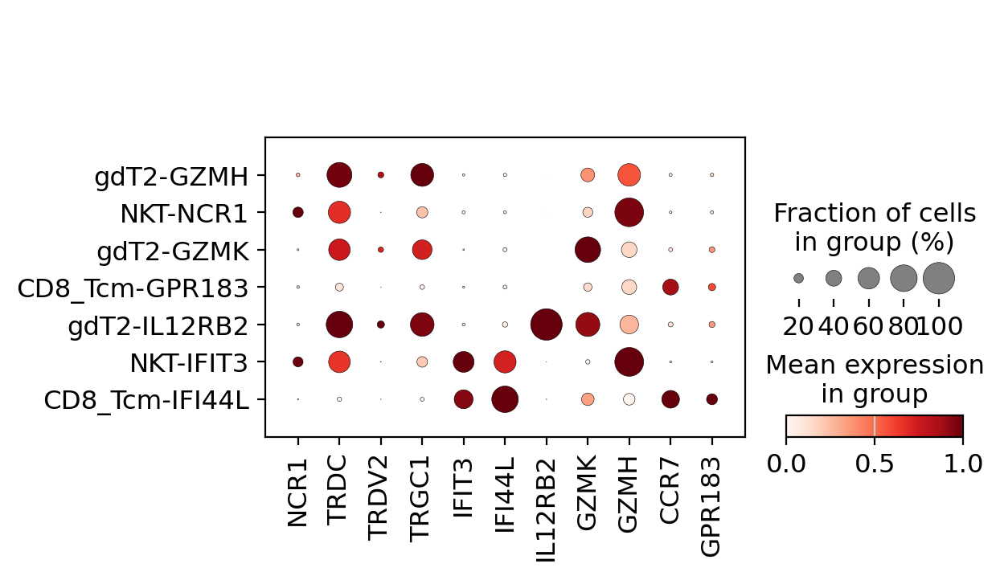

In [101]:
sc.pl.dotplot(adata_sub, ["NCR1","TRDC",'TRDV2',"TRGC1",'IFIT3',"IFI44L",'IL12RB2','GZMK',
                          'GZMH','CCR7','GPR183'],
              groupby='leiden_r0.8_n2',standard_scale='var')

In [96]:
adata.obs['celltype_r2.5'] = adata.obs['leiden_r2.5_n2']

In [97]:
adata.obs['celltype_r2.5'] = adata.obs.index.map(adata_sub.obs['leiden_r0.8_n2'].to_dict())

In [98]:
adata.obs['celltype_r2.5'].fillna(adata.obs['leiden_r2.5_n2'],inplace=True)

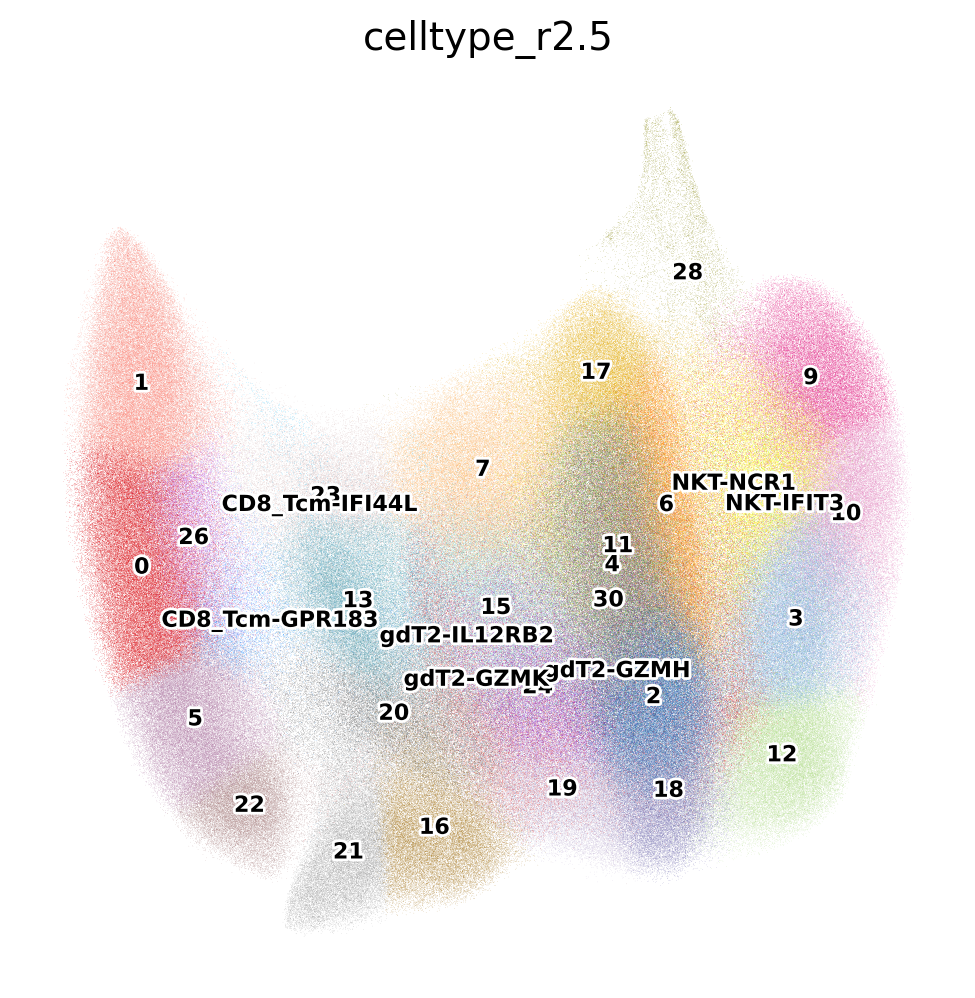

In [102]:
with rc_context({'figure.figsize': (6, 6)}):
    sc.pl.umap(adata, color=['celltype_r2.5'],legend_loc="on data",
               legend_fontsize=8, legend_fontoutline=2,palette=cluster_cols)

In [104]:
adata.write('/media/AnalysisDisk1/Yanshichen/0_HIV_RNA/HIV-pbmc2/CD8_filter.h5ad')

### COSG

In [105]:
import cosg as cosg
import importlib
importlib.reload(cosg)

<module 'cosg' from '/home/yangshichen/mambaforge/envs/rsc/lib/python3.10/site-packages/cosg/__init__.py'>

In [106]:
cosg.cosg(adata,
    key_added='cosg',
    mu=1,
    n_genes_user=50,
    groupby='celltype_r2.5')

**finished identifying marker genes by COSG**


In [107]:
colnames = ['names', 'scores']
test = [pd.DataFrame(adata.uns["cosg"][c]) for c in colnames]
test = pd.concat(test, axis=1, names=[None, 'group'], keys=colnames)

markers = {}
cats = adata.obs['celltype_r2.5'].cat.categories
for i, c in enumerate(cats):
    cell_type_df = test.loc[:, 'names'][str(c)]
    scores_df = test.loc[:, 'scores'][str(c)]
    markers[str(c)] = cell_type_df.values.tolist()[:10]

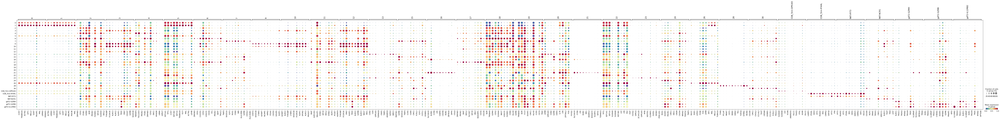

In [108]:
sc.pl.dotplot(adata, 
              var_names = markers, 
              groupby='celltype_r2.5',
              cmap='Spectral_r',
              standard_scale='var',save='_celltype_r2.5.pdf') 

In [109]:
marker_gene=pd.DataFrame(adata.uns['cosg']['names'])
marker_gene.head()

,0,1,10,11,12,13,15,16,17,18,...,6,7,9,CD8_Tcm-GPR183,CD8_Tcm-IFI44L,NKT-IFIT3,NKT-NCR1,gdT2-GZMH,gdT2-GZMK,gdT2-IL12RB2
0,CCR7,ACTN1,IGFBP7,MIAT,TYROBP,CD82,GZMK,SLC4A10,ZNF683,B2M,...,ZNF683,TNIP3,CHST2,S100A9,LAMP3,IFIT3,CD160,KLRC1,EGR1,IL12RB2
1,TRABD2A,LRRN3,KLRC2,A2M-AS1,FCGR3A,CD4,SH2D1A,KLRB1,PROK2,TMSB4X,...,CES1,SH2D1A,SH2D1B,S100A8,IFI44L,RSAD2,IKZF2,TRGC1,TRDV2,TRDV2
2,ACTN1,CCR7,TYROBP,MALAT1,GNLY,GPR183,TNIP3,CCR6,MIAT,GZMH,...,CX3CR1,E2F3,CTBP2,LYZ,OAS3,IFIT1,DRAIC,TRDV2,IL18RAP,TRGC1
3,LEF1,TRABD2A,CTBP2,SYNE1,KLRF1,TSPAN18,CCR5,LTK,PATL2,CD52,...,CD52,RGS1,IGFBP7,VCAN,IFIT1,IFI44L,TRDV1,RTKN2,TRGC1,KLRC1
4,NELL2,LEF1,SH2D1B,KIF19,TRDC,CRIP2,CD84,CEBPD,SLC4A7,S100A4,...,LGALS1,CD84,NCAM1,ANKRD55,RSAD2,MX1,CMC1,TRGV9,CYB561,IL18RAP


In [110]:
marker_gene.to_csv('/media/AnalysisDisk1/Yanshichen/0_HIV_RNA/Subcelltype/CD8/figures/_lcelltype_r2.5_marker_gene.csv')

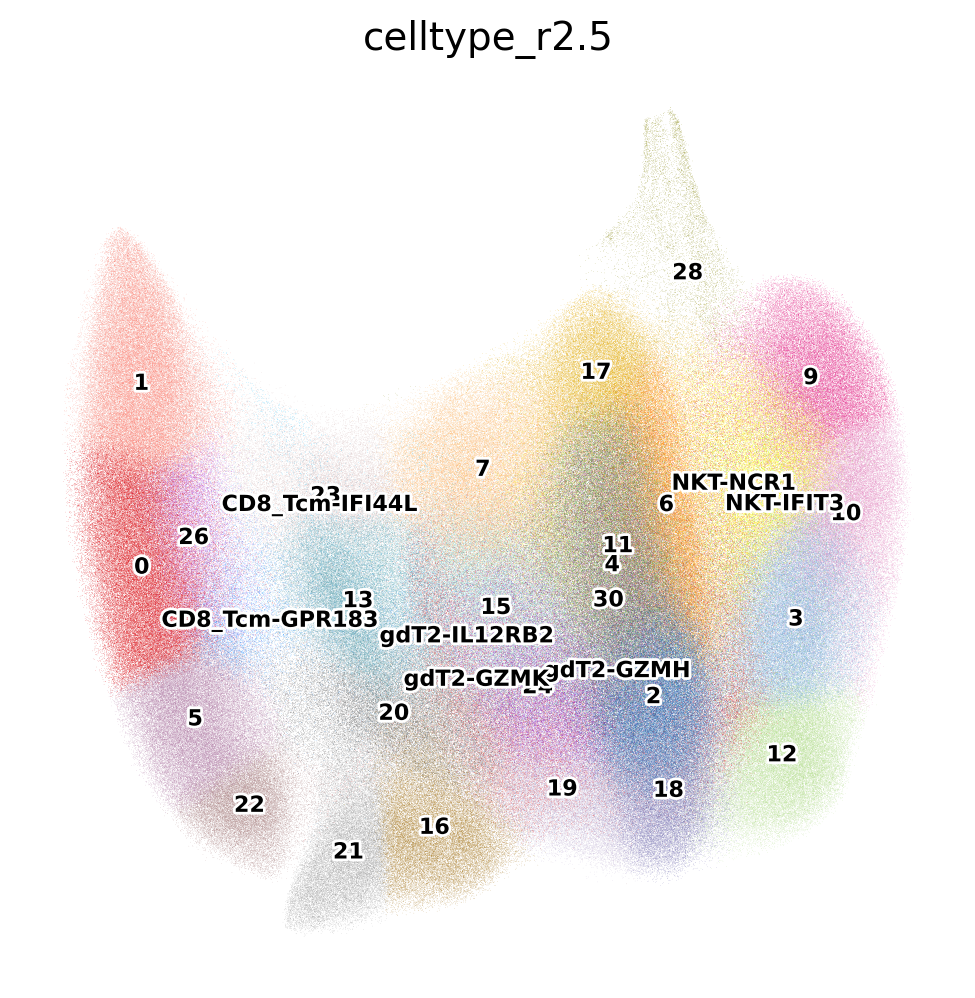

In [113]:
with rc_context({'figure.figsize': (6, 6)}):
    sc.pl.umap(adata, color=['celltype_r2.5'],legend_loc="on data",
               legend_fontsize=8, legend_fontoutline=2,palette=cluster_cols)

### 注释

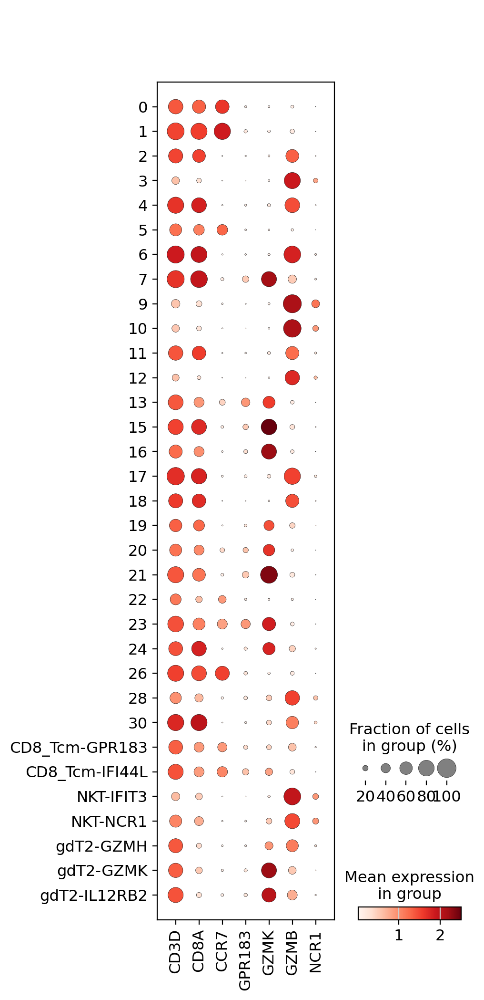

In [120]:
sc.pl.dotplot(adata, ["CD3D","CD8A","CCR7","GPR183","GZMK","GZMB","NCR1"], groupby='celltype_r2.5')
             #standard_scale='var')

In [133]:
adata.obs = adata.obs.drop(['celltype_L3'],axis=1)
adata

AnnData object with n_obs × n_vars = 1261644 × 21679
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'doublet', 'batch', 'sample', 'stage', 'experiments', 'age', 'total_counts_rp', 'pct_counts_rp', 'total_counts_hb', 'pct_counts_hb', 'total_counts_ncRNA', 'pct_counts_ncRNA', 'total_counts_LOC', 'pct_counts_LOC', 'total_counts_erccs', 'pct_counts_erccs', 'celltype_L1', 'phase_ordered', 'leiden_r2.5_n2', 'celltype_r2.5'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection', 'mean', 'std'
    uns: 'age_colors', 'experiments_colors', 'hvg', 'leiden', 'leiden_r5.0_n2_colors', 'log1p', 'neighbors', 'pca', 'stage_colors', 'umap', 'leiden_r2.2_n2_colors', 'leiden_r2.5_n2_colors', 'celltype_r2.5_colors', 'cosg', 'rank_genes_groups', 'phase_ordered_colors'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivit

In [134]:
new_cluster_names = ['CD8_Naive_T-CCR7','CD8_Naive_T-CCR7','CD8_CTL-GZMB','NKT-NCR1','CD8_CTL-GZMB',
                     'CD8_Naive_T-CCR7','CD8_CTL-GZMB','CD8_Tem-GZMK','NKT-NCR1','NKT-NCR1','CD8_CTL-GZMB',
                     'NKT-NCR1','CD8_Tcm-GZMK','CD8_Tem-GZMK','MAIT-SLC4A10','CD8_CTL-GZMB','CD8_CTL-GZMB',
                     'CD8_CTL-GZMK','CD8_Tcm-GZMK','MAIT-SLC4A10','CD8_Naive_T-CCR7','CD8_Tcm-GZMK','CD8_CTL-GZMK',
                     'CD8_Naive_T-CCR7','Cycling_T-MKI67','CD8_CTL-GZMB','CD8_Tcm-GPR183','CD8_Tcm-IFI44L','NKT-IFIT3',
                     'NKT-NCR1','gdT2-GZMH','gdT2-GZMK','gdT2-IL12RB2']
adata.obs['celltype_L3']=adata.obs['celltype_r2.5'].replace(to_replace = list(adata.obs['celltype_r2.5'].cat.categories.values),
                                                         value = new_cluster_names)

In [138]:
adata.obs['celltype_L3'].value_counts()

CD8_CTL-GZMB        308502
NKT-NCR1            269960
CD8_Naive_T-CCR7    244581
CD8_Tcm-GZMK        107328
CD8_Tem-GZMK         96980
MAIT-SLC4A10         67717
CD8_CTL-GZMK         64037
gdT2-GZMH            44477
CD8_Tcm-GPR183       15761
gdT2-GZMK            15250
Cycling_T-MKI67      10627
gdT2-IL12RB2          7641
NKT-IFIT3             4489
CD8_Tcm-IFI44L        4294
Name: celltype_L3, dtype: int64

In [135]:
phases = ['CD8_Naive_T-CCR7','CD8_Tcm-GPR183','CD8_Tcm-IFI44L','CD8_Tcm-GZMK','CD8_Tem-GZMK',
          'CD8_CTL-GZMK','CD8_CTL-GZMB','MAIT-SLC4A10','gdT2-GZMK','gdT2-GZMH','gdT2-IL12RB2',
          'Cycling_T-MKI67','NKT-NCR1','NKT-IFIT3']
adata.obs["phase_ordered"] = pd.Categorical(values=adata.obs.celltype_L3, categories=phases, ordered=True)

In [148]:
CD8_colors={'CD8_Naive_T-CCR7':'#8799A4',
            'CD8_Tcm-GPR183':'#C2CDCA',
            'CD8_Tcm-IFI44L':'#3E4952',
            'CD8_Tcm-GZMK':'#7C9999',
            'CD8_Tem-GZMK':'#667F85',
            'CD8_CTL-GZMK':'#A0AEB0',
            'CD8_CTL-GZMB':'#7E9594',
            'MAIT-SLC4A10':'#89AEAE',
            'gdT2-GZMK':'#6F9FB7',
            'gdT2-GZMH':'#90B0B2',
            'gdT2-IL12RB2':'#708C9B',
            'Cycling_T-MKI67':'#5F88A1',
            'NKT-NCR1':'#6C9FA9',
            'NKT-IFIT3':'#717677'
}

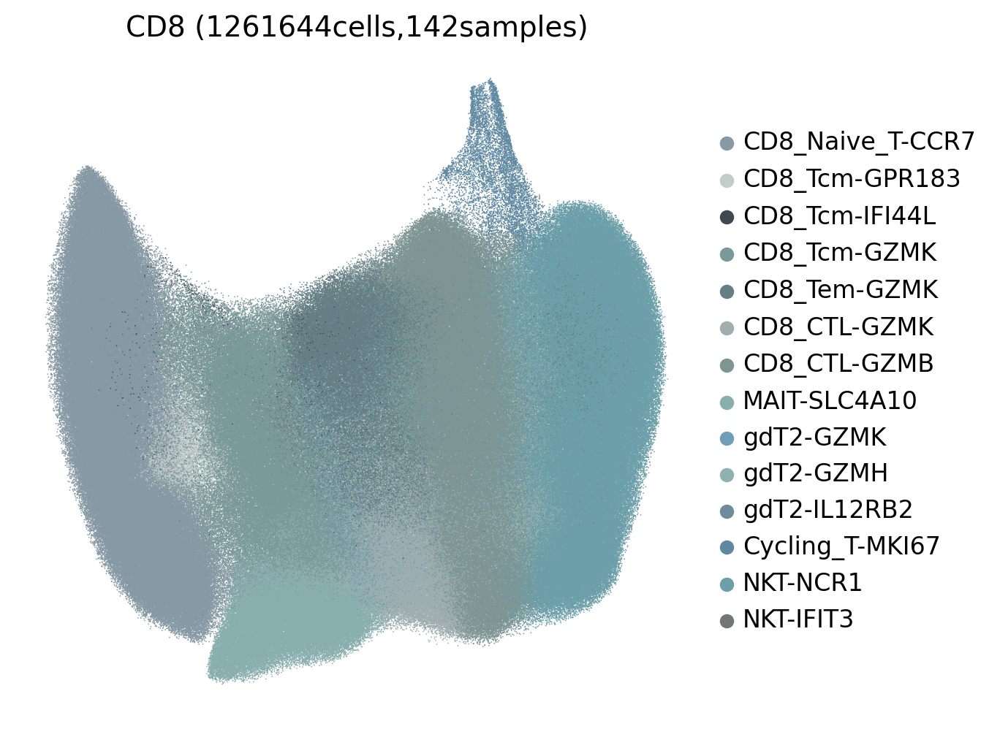

In [149]:
with rc_context({'figure.figsize': (6, 6)}):
    sc.pl.umap(adata,color=['phase_ordered'],legend_fontsize=12,size=1.5,legend_fontoutline=2,
               palette=CD8_colors,title='CD8 (1261644cells,142samples)',#legend_loc="on data",
               save='_CD8_celltype_L3.pdf')

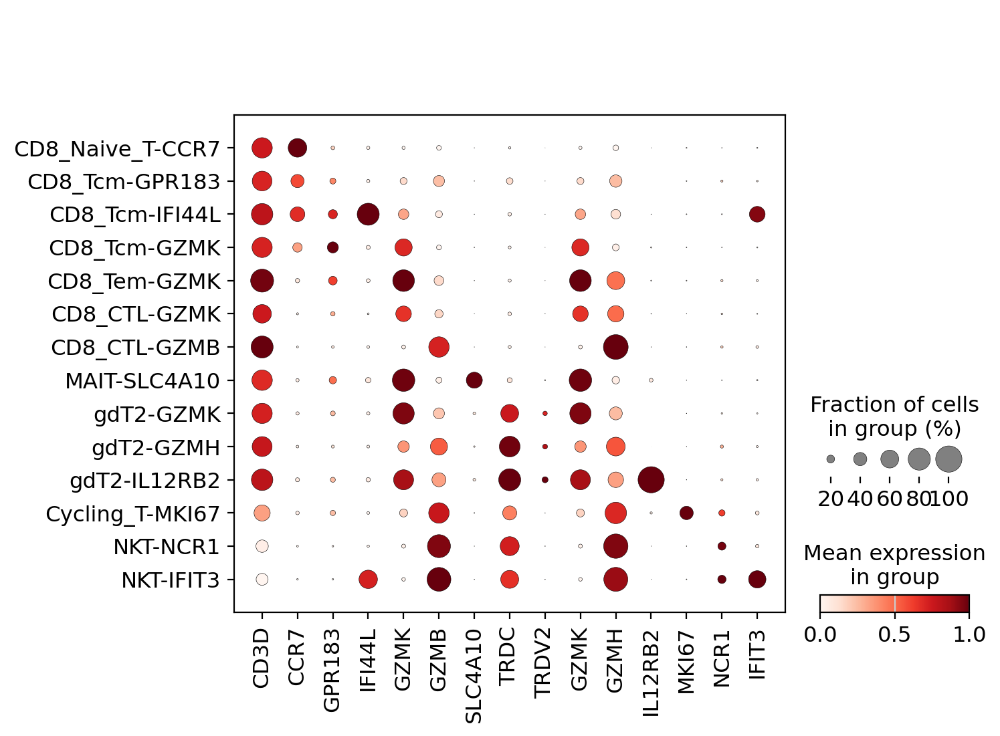

In [143]:
sc.pl.dotplot(adata, ["CD3D","CCR7","GPR183","IFI44L","GZMK","GZMB","SLC4A10","TRDC","TRDV2","GZMK","GZMH",
                      "IL12RB2","MKI67","NCR1","IFIT3"], 
              categories_order=['CD8_Naive_T-CCR7','CD8_Tcm-GPR183','CD8_Tcm-IFI44L','CD8_Tcm-GZMK','CD8_Tem-GZMK',
                                'CD8_CTL-GZMK','CD8_CTL-GZMB','MAIT-SLC4A10','gdT2-GZMK','gdT2-GZMH','gdT2-IL12RB2',
                                'Cycling_T-MKI67','NKT-NCR1','NKT-IFIT3'],standard_scale='var',
              groupby='celltype_L3',save='celltype_L3.pdf')

In [153]:
adata.write('/media/AnalysisDisk1/Yanshichen/0_HIV_RNA/HIV-pbmc2/CD8_celltype.h5ad')

### 细胞比例

In [154]:
# 计算每个样本中每种细胞类型的计数
cell_counts = adata.obs.groupby(['sample', 'celltype_L3']).size().reset_index(name='count')
# 计算每个样本中细胞类型的总计数
sample_totals = cell_counts.groupby('sample')['count'].sum().reset_index(name='total_count')
# 合并计数和总计数数据框
merged_data = pd.merge(cell_counts, sample_totals, on='sample')
# 计算每个样本中细胞类型的比例
merged_data['proportion'] = merged_data['count'] / merged_data['total_count']
# 输出结果
print(merged_data)
merged_data.to_csv('/media/AnalysisDisk1/Yanshichen/0_HIV_RNA/Subcelltype/CD8/proportions_L3.csv', index=False)

       sample       celltype_L3  count  total_count  proportion
0     HD-H134  CD8_Naive_T-CCR7   5168        18840    0.274310
1     HD-H134      CD8_CTL-GZMB   4869        18840    0.258439
2     HD-H134      CD8_Tem-GZMK   1504        18840    0.079830
3     HD-H134      CD8_Tcm-GZMK   1206        18840    0.064013
4     HD-H134      MAIT-SLC4A10    973        18840    0.051645
...       ...               ...    ...          ...         ...
1983  PD-H308         NKT-IFIT3      9         4562    0.001973
1984  PD-H308          NKT-NCR1    853         4562    0.186979
1985  PD-H308         gdT2-GZMH     61         4562    0.013371
1986  PD-H308         gdT2-GZMK     23         4562    0.005042
1987  PD-H308      gdT2-IL12RB2     17         4562    0.003726

[1988 rows x 5 columns]


### DEG

In [223]:
adata=sc.read('/media/AnalysisDisk1/Yanshichen/0_HIV_RNA/HIV-pbmc2/CD8_celltype.h5ad')
adata

AnnData object with n_obs × n_vars = 1307895 × 2075
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'doublet', 'batch', 'sample', 'stage', 'total_counts_rp', 'pct_counts_rp', 'total_counts_hb', 'pct_counts_hb', 'total_counts_ncRNA', 'pct_counts_ncRNA', 'total_counts_LOC', 'pct_counts_LOC', 'total_counts_erccs', 'pct_counts_erccs', 'age', 'leiden_r2.0_n2', 'leiden_r1.8_n2', 'phase_ordered', 'leiden_r2.3_n2', 'CD8_celltype_L2'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection', 'mean', 'std'
    uns: 'cosg', 'hvg', 'leiden', 'leiden_r0.8_n2_colors', 'leiden_r1.0_n2_colors', 'leiden_r1.2_n2_colors', 'leiden_r1.5_n2_colors', 'leiden_r1.8_n2_colors', 'leiden_r2.0_n2_colors', 'leiden_r2.3_n2_colors', 'leiden_r2.5_n2_colors', 'leiden_r3.0_n2_colors', 'log1p', 'neighbors', 'pca', 'phase_ordered_colors', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_p

In [155]:
unique_celltypes = adata.obs['celltype_L3'].unique()
unique_celltypes

['CD8_Naive_T-CCR7', 'gdT2-GZMH', 'CD8_CTL-GZMK', 'CD8_Tcm-GZMK', 'CD8_CTL-GZMB', ..., 'Cycling_T-MKI67', 'gdT2-IL12RB2', 'gdT2-GZMK', 'NKT-IFIT3', 'CD8_Tcm-IFI44L']
Length: 14
Categories (14, object): ['CD8_Naive_T-CCR7', 'CD8_CTL-GZMB', 'CD8_Tem-GZMK', 'CD8_Tcm-GZMK', ..., 'NKT-NCR1', 'gdT2-GZMH', 'gdT2-GZMK', 'gdT2-IL12RB2']

In [156]:
for celltype in unique_celltypes:
    celltype_data = adata[adata.obs['celltype_L3'] == celltype, :]
    celltype_data.uns['log1p']['base']=None
    sc.tl.rank_genes_groups(celltype_data, groupby='stage',groups=['IRs','INRs'],reference='HDs',method='wilcoxon', key_added = "wilcoxon_HDs")
    sc.tl.rank_genes_groups(celltype_data, groupby='stage',groups=['INRs'],reference='IRs',method='wilcoxon', key_added = "wilcoxon_IRs")
    genes1 = sc.get.rank_genes_groups_df(celltype_data, group='IRs', key='wilcoxon_HDs')
    genes2 = sc.get.rank_genes_groups_df(celltype_data, group='INRs', key='wilcoxon_HDs')
    genes3 = sc.get.rank_genes_groups_df(celltype_data, group='INRs', key='wilcoxon_IRs')
    genes1.to_csv('/media/AnalysisDisk1/Yanshichen/0_HIV_RNA/Subcelltype/CD8/DEG/{}_IRs_vs_HDs.csv'.format(celltype), index=False)
    genes2.to_csv('/media/AnalysisDisk1/Yanshichen/0_HIV_RNA/Subcelltype/CD8/DEG/{}_INRs_vs_HDs.csv'.format(celltype), index=False)
    genes3.to_csv('/media/AnalysisDisk1/Yanshichen/0_HIV_RNA/Subcelltype/CD8/DEG/{}_INRs_vs_IRs.csv'.format(celltype), index=False)

ranking genes
    finished: added to `.uns['wilcoxon_HDs']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:24:10)
ranking genes
    finished: added to `.uns['wilcoxon_IRs']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:07:42)
ranking genes
    finished: added to `.uns['wilcoxon_HDs']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group